# Google Drive Mount

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


## Imports

In [ ]:
!pip install -q tensorboardX

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 3.3 MB/s eta 0:00:00


## Utils

In [ ]:
dataset_dir = '/content/drive/My Drive/6322_Project_Folder/datasets'
data_dir = '/content/drive/My Drive/6322_Project_Folder/data'
DH_dir = 'Dense_Haze'
ITS_dir = 'ITS'
SOTS_dir = 'SOTS'
NH_dir = 'NH_Haze'
base = '/content/drive/My Drive/6322_Project_Folder/'

#### Saidul drive

In [ ]:
dataset_dir = '/content/drive/MyDrive/Academic/Course Work/Masters YorkU/Winter 2023-24/EECS 6322/6322_Project_Folder/datasets'
data_dir = '/content/drive/MyDrive/Academic/Course Work/Masters YorkU/Winter 2023-24/EECS 6322/6322_Project_Folder/data'
DH_dir = 'Dense_Haze'
ITS_dir = 'ITS'
SOTS_dir = 'SOTS'
NH_dir = 'NH_Haze'
base = '/content/drive/MyDrive/Academic/Course Work/Masters YorkU/Winter 2023-24/EECS 6322/6322_Project_Folder'

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import json
import os
import random
import sys
import time
import math
import torch
import torch.utils.data as data
import torchvision.transforms as tfs
from torchvision.transforms import functional as FF
from PIL import Image
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
import h5py
import glob
from tensorboardX import SummaryWriter

from torch.backends import cudnn
from torch import optim
import torch, warnings
from torch import nn

import torch.nn.functional as F
from torch.nn import init
import functools

from torch.autograd import Variable
from torchvision import models

py_file_location = os.path.join(base, 'DCNv2_pytorch')
print(py_file_location)
sys.path.append(os.path.abspath(py_file_location))

from dcn import DeformableConv2d as DCN
from torch.nn.modules import conv
from torch.nn.modules.utils import _pair
import warnings
warnings.filterwarnings('ignore')

/content/drive/My Drive/6322_Project_Folder/DCNv2_pytorch


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


### Metrics

In [ ]:
def create_gaussian_kernel(window_size, sigma):

    center = window_size // 2
    kernel_values = [
        math.exp(-(x - center) ** 2 / (2 * sigma ** 2))
        for x in range(window_size)
    ]

    kernel = torch.Tensor(kernel_values)
    kernel = kernel / kernel.sum()

    return kernel

def create_gaussian_window(window_size, channel, sigma=1.5):

    kernel_1d = create_gaussian_kernel(window_size,sigma).unsqueeze(1)
    kernel_2d = kernel_1d.mm(kernel_1d.t()).float().unsqueeze(0).unsqueeze(0)

    kernel = Variable(kernel_2d.expand(channel, 1, window_size, window_size).contiguous())

    return kernel

def _ssim(image1, image2, kernel, window_size, channel, size_average=True):
    def calculate_mean(image, kernel, window_size, channel):
        return F.conv2d(image, kernel, padding=window_size // 2, groups=channel)

    def calculate_variance(image, window, window_size, channel):
        image_squared = image * image  # Square for variance computation
        return F.conv2d(image_squared, window, padding=window_size // 2, groups=channel)

    def calculate_covariance(image1, image2, window, window_size, channel):
        return F.conv2d(image1 * image2, window, padding=window_size // 2, groups=channel)

    mean1 = calculate_mean(image1, kernel, window_size, channel)
    mean2 = calculate_mean(image2, kernel, window_size, channel)

    variance1 = calculate_variance(image1, kernel, window_size, channel) - mean1.pow(2)
    variance2 = calculate_variance(image2, kernel, window_size, channel) - mean2.pow(2)

    covariance = calculate_covariance(image1, image2, kernel, window_size, channel) - mean1 * mean2

    C1 = 0.01 ** 2
    C2 = 0.03 ** 2

    ssim_map = ((2 * mean1 * mean2 + C1) * (2 * covariance + C2)) / \
               ((mean1.pow(2) + mean2.pow(2) + C1) * (variance1 + variance2 + C2))

    if size_average:
        return ssim_map.mean()
    else:
        return ssim_map.mean(1).mean(1).mean(1)

def ssim(image1, image2, window_size=11, size_average=True):
    image1 = torch.clamp(image1, min=0, max=1)
    image2 = torch.clamp(image2, min=0, max=1)

    (_, channels, _, _) = image1.size()

    kernel = create_gaussian_window(window_size, channels)

    if image1.is_cuda:
        kernel = kernel.cuda(image1.get_device())

    kernel = kernel.type_as(image1)

    return _ssim(image1, image2, kernel, window_size, channels, size_average)

def psnr(pred, gt):
    pred = np.clip(pred.detach().cpu().numpy(), 0, 1).astype(np.float32)
    gt = np.clip(gt.detach().cpu().numpy(), 0, 1).astype(np.float32)

    mse = np.mean((pred - gt) ** 2)

    if mse == 0:
        return 100

    max_pixel_value = 1.0
    psnr = 20 * math.log10(max_pixel_value / math.sqrt(mse))

    return psnr

## Load Dataset

```
Dense-Haze is the NTIRE2019 challenge dataset in the single image dehazing task, which consists of dense and
homogeneous hazy scenes. The hazy scenes have been recorded by introducing real haze generated by
professional haze machines. It consists of 45 training images, 5 validation images and 5 test images. As the
ground-truth test images are not public, we use validation images as test set in our work. NH-HAZE is
the NTIRE2020 challenge dataset in the single image dehazing task, which also consists of 45 training
images, 5 validation images and 5 test images. As both the ground-truth of validation images and test images
are not public, we divide training images into training set and test set which consist of 40 images and 5
images respectively. Different from other datasets, the hazy on NH-HAZE is nonhomogeneous. The sizes both in
Dense-Haze and Dense-Haze are 1,600×1,200.
```

### Dense-haze dataset

In [ ]:
config = {
    'epochs': 100,
    'eval_step': 5000,
    'lr': 0.0001,
    'model_dir': 'trained_models',
    'model_name': 'AECR_Net',
    'bs': 16,
    'size': 224,
}

print(config)
print('model_dir:', config['model_dir'])

{'epochs': 100, 'eval_step': 5000, 'lr': 0.0001, 'model_dir': 'trained_models', 'model_name': 'AECR_Net', 'bs': 16, 'size': 224}
model_dir: trained_models


In [ ]:
batch_size = config['bs']
size = config['size']

In [ ]:
class DHAZE_Dataset(data.Dataset):
    def __init__(self, path, train, size, format='.png'):
        super(DHAZE_Dataset, self).__init__()
        self.size = size
        self.train = train
        self.hazy_path = path + '/hazy/'
        self.gt_path = path + '/gt/'
        self.format = format

    def __getitem__(self, index):
        index = index + 1
        # print(f"HAZY PATH: {self.hazy_path}")
        # print(f"GT PATH: {self.gt_path}")
        # print(f"FORMAT: {self.format}\n")
        hazy_filename = self.hazy_path + str(index) + '_hazy' + self.format
        # print(hazy_filename)
        gt_filename = self.gt_path + str(index) + '_GT' + self.format
        # print(gt_filename)

        hazy = Image.open(hazy_filename)
        gt = Image.open(gt_filename)

        gt = tfs.CenterCrop(hazy.size[::-1])(gt)

        if not isinstance(self.size, str):
            i, j, h, w = tfs.RandomCrop.get_params(hazy, output_size=(self.size, self.size))
            hazy = FF.crop(hazy, i, j, h, w)
            gt = FF.crop(gt, i, j, h, w)

        hazy, gt = self.augment_data(hazy.convert("RGB"), gt.convert("RGB"))

        return hazy, gt

    def augment_data(self, hazy, gt):

        if self.train:
            rand_hor = random.randint(0, 1)
            rand_rot = random.randint(0, 3)
            hazy = tfs.RandomHorizontalFlip(rand_hor)(hazy)
            gt = tfs.RandomHorizontalFlip(rand_hor)(gt)
            if rand_rot:
                hazy = FF.rotate(hazy, 90*rand_rot)
                gt = FF.rotate(gt, 90*rand_rot)

        hazy = tfs.ToTensor()(hazy)
        gt = tfs.ToTensor()(gt)

        return hazy, gt

    def __len__(self):
        train_list = glob.glob(self.hazy_path + '/*')

        return len(train_list)

# dataset=HAZE_Dataset(os.path.join(dataset_dir, DH_dir, 'Dense_train'), train=True,size=crop_size)

DH_train_loader=DataLoader(dataset=DHAZE_Dataset(os.path.join(dataset_dir, DH_dir, 'Dense_train'), train=True, size=size), batch_size=batch_size, shuffle=True)
DH_test_loader=DataLoader(dataset=DHAZE_Dataset(os.path.join(dataset_dir, DH_dir, 'Dense_test'), train=False, size=size), batch_size=1, shuffle=False)

In [ ]:
print(len(DH_train_loader))
len(DH_test_loader)

4


5

In [ ]:
print(len(DH_train_loader.dataset))

50


In [ ]:
ds=DHAZE_Dataset(os.path.join(dataset_dir, DH_dir, 'Dense_test'), train=False, size=size)

In [ ]:
def plot_sample(dataset, index=0):
    """Plots a sample 'haze' and 'clear' image pair from the dataset."""
    haze, clear = dataset[index]

    # Convert tensors to NumPy for plotting
    haze_img = haze.numpy().transpose((1, 2, 0))
    clear_img = clear.numpy().transpose((1, 2, 0))

    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

    # Plot the hazy image
    ax1.imshow(haze_img)
    ax1.set_title('Hazy Image')

    # Plot the clear image
    ax2.imshow(clear_img)
    ax2.set_title('Clear Image')

    plt.tight_layout()
    plt.show()

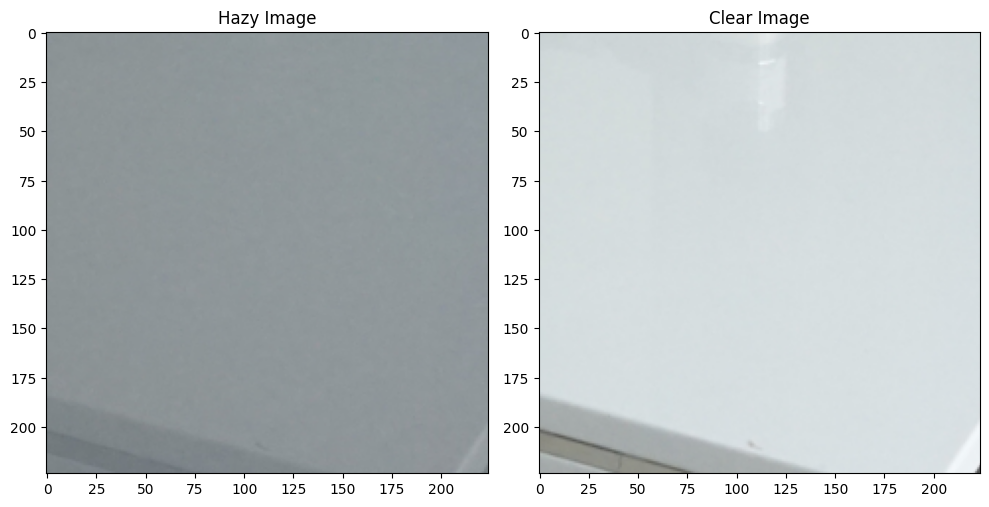

In [ ]:
plot_sample(ds, index=3)

### ITS-dataset

In [ ]:
class ITS_HAZE_Dataset(data.Dataset):
    def __init__(self, path, train, size, format='.png'):
        super(ITS_HAZE_Dataset, self).__init__()
        self.size = size
        self.train = train
        self.hazy_path = path + '/hazy/'
        self.gt_path = path + '/gt/'
        self.format = format
        self.gt_images = sorted(glob.glob(self.gt_path + '/*' + self.format))
        self.hazy_images = sorted(glob.glob(self.hazy_path + '*' + self.format))
        self.num_hazy_per_gt = 10

    def __getitem__(self, index):
        #print("Dataloader Index: " +str(index))
        gt_index = index // self.num_hazy_per_gt
        gt_filename = self.gt_images[gt_index]

        gt_base = gt_filename.split('/')[-1].split('.')[0]
        matching_hazy_images = [hazy for hazy in self.hazy_images if hazy.split('/')[-1].startswith(gt_base+'_')]

        hazy_index = index % self.num_hazy_per_gt
        hazy_filename = matching_hazy_images[hazy_index]

        hazy = Image.open(hazy_filename)
        gt = Image.open(gt_filename)

        gt = tfs.CenterCrop(hazy.size[::-1])(gt)

        if not isinstance(self.size, str):
            i, j, h, w = tfs.RandomCrop.get_params(hazy, output_size=(self.size, self.size))
            hazy = FF.crop(hazy, i, j, h, w)
            gt = FF.crop(gt, i, j, h, w)


        hazy, gt = self.augment_data(hazy.convert("RGB"), gt.convert("RGB"))

        return hazy, gt

    def augment_data(self, hazy, gt):
        if self.train:
            rand_hor = random.randint(0, 1)
            rand_rot = random.randint(0, 3)
            hazy = tfs.RandomHorizontalFlip(rand_hor)(hazy)
            gt = tfs.RandomHorizontalFlip(rand_hor)(gt)
            if rand_rot:
                hazy = FF.rotate(hazy, 90*rand_rot)
                gt = FF.rotate(gt, 90*rand_rot)

        hazy = tfs.ToTensor()(hazy)
        gt = tfs.ToTensor()(gt)

        return hazy, gt

    def __len__(self):
        return len(self.gt_images) * self.num_hazy_per_gt


In [ ]:
ITS_train_loader=DataLoader(dataset=ITS_HAZE_Dataset(os.path.join(dataset_dir, ITS_dir, 'ITS_train'), train=True,size=size), batch_size=batch_size, shuffle=True)
ITS_test_loader=DataLoader(dataset=ITS_HAZE_Dataset(os.path.join(dataset_dir, ITS_dir, 'ITS_test'),train=False,size=size), batch_size=1, shuffle=False)

In [ ]:
SOTS_test_loader=DataLoader(dataset=ITS_HAZE_Dataset(os.path.join(dataset_dir, SOTS_dir, 'SOTS_test'),train=False,size=size), batch_size=1, shuffle=False)

In [ ]:
print(len(SOTS_test_loader))

500


In [ ]:
print(len(ITS_train_loader))
len(ITS_test_loader)

813


990

In [ ]:
print(len(ITS_train_loader.dataset))

13000


In [ ]:
ds=ITS_HAZE_Dataset(os.path.join(dataset_dir, ITS_dir, 'ITS_train'), train=False, size=size)

In [ ]:
def plot_sample(dataset, index=0):
    """Plots a sample 'haze' and 'clear' image pair from the dataset."""
    haze, clear = dataset[index]

    # Convert tensors to NumPy for plotting
    haze_img = haze.numpy().transpose((1, 2, 0))
    clear_img = clear.numpy().transpose((1, 2, 0))

    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

    # Plot the hazy image
    ax1.imshow(haze_img)
    ax1.set_title('Hazy Image')

    # Plot the clear image
    ax2.imshow(clear_img)
    ax2.set_title('Clear Image')

    plt.tight_layout()
    plt.show()

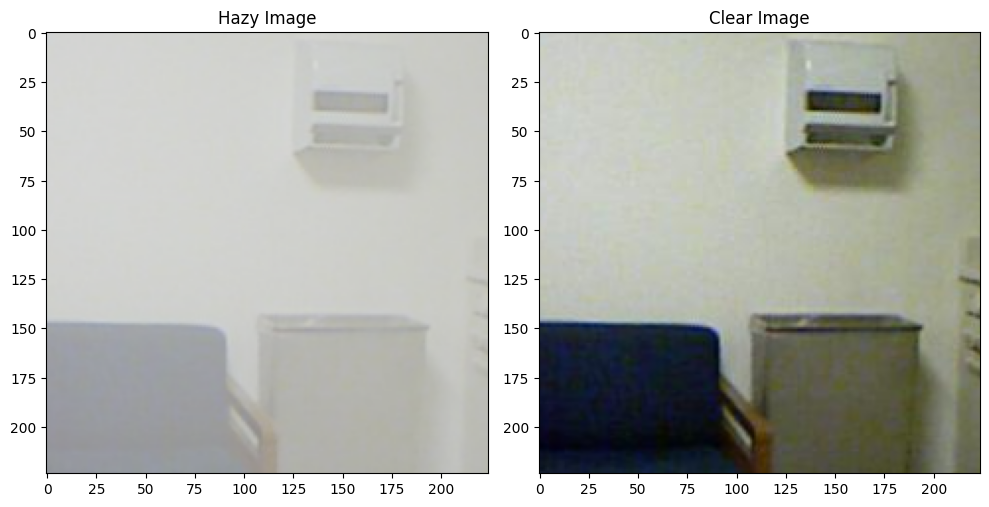

In [ ]:
plot_sample(ds, index=3)

### NH-Haze

In [ ]:
class NH_HAZE_Dataset(data.Dataset):
    def __init__(self, path, train, size, format='.png'):
        super(NH_HAZE_Dataset, self).__init__()
        self.size = size
        self.train = train
        self.hazy_path = path + '/hazy/'
        self.gt_path = path + '/gt/'
        self.format = format

    def __getitem__(self, index):
        index = index + 1
        # print(f"HAZY PATH: {self.hazy_path}")
        # print(f"GT PATH: {self.gt_path}")
        # print(f"FORMAT: {self.format}\n")
        hazy_filename = self.hazy_path + str(index) + '_hazy' + self.format
        # print(hazy_filename)
        gt_filename = self.gt_path + str(index) + '_GT' + self.format
        # print(gt_filename)

        hazy = Image.open(hazy_filename)
        gt = Image.open(gt_filename)

        gt = tfs.CenterCrop(hazy.size[::-1])(gt)

        if not isinstance(self.size, str):
            i, j, h, w = tfs.RandomCrop.get_params(hazy, output_size=(self.size, self.size))
            hazy = FF.crop(hazy, i, j, h, w)
            gt = FF.crop(gt, i, j, h, w)

        hazy, gt = self.augment_data(hazy.convert("RGB"), gt.convert("RGB"))

        return hazy, gt

    def augment_data(self, hazy, target):

        if self.train:
            rand_hor = random.randint(0, 1)
            rand_rot = random.randint(0, 3)
            hazy = tfs.RandomHorizontalFlip(rand_hor)(hazy)
            gt = tfs.RandomHorizontalFlip(rand_hor)(gt)
            if rand_rot:
                hazy = FF.rotate(hazy, 90*rand_rot)
                gt = FF.rotate(gt, 90*rand_rot)

        hazy = tfs.ToTensor()(hazy)
        gt = tfs.ToTensor()(gt)

        return hazy, gt

    def __len__(self):
        train_list = glob.glob(self.hazy_path + '/*')

        return len(train_list)


In [ ]:
NH_train_loader=DataLoader(dataset=NH_HAZE_Dataset(os.path.join(dataset_dir, NH_dir, 'NH_train'), train=True,size=size),batch_size=batch_size,shuffle=True)
NH_test_loader=DataLoader(dataset=NH_HAZE_Dataset(os.path.join(dataset_dir, NH_dir, 'NH_test'),train=False,size=size),batch_size=1,shuffle=False)

In [ ]:
print(len(NH_train_loader))
len(NH_test_loader)

4


5

Just In Case section

In [ ]:
save_path = '/content/drive/My Drive/6322_Project_Folder/saved_loaded_datasets_initial'

In [ ]:
import pickle

In [ ]:
its_train_pickle_filename = save_path + '/ITS_train_loader.pkl'
its_test_pickle_filename = save_path + '/ITS_test_loader.pkl'
nh_train_pickle_filename = save_path + '/NH_train_loader.pkl'
nh_test_pickle_filename = save_path + '/NH_test_loader.pkl'
dhd_train_pickle_filename = save_path + '/DH_train_loader.pkl'
dhd_test_pickle_filename = save_path + '/DH_test_loader.pkl'

Save DataLoaders (Just In Case)

In [ ]:
# Assuming 'data_loader' is your DataLoader
with open(its_train_pickle_filename, 'wb') as f:
    pickle.dump(ITS_train_loader, f)
with open(its_test_pickle_filename, 'wb') as f:
    pickle.dump(ITS_test_loader, f)
with open(nh_train_pickle_filename, 'wb') as f:
    pickle.dump(NH_train_loader, f)
with open(nh_test_pickle_filename, 'wb') as f:
    pickle.dump(NH_test_loader, f)
with open(dhd_train_pickle_filename, 'wb') as f:
    pickle.dump(DH_train_loader, f)
with open(dhd_test_pickle_filename, 'wb') as f:
    pickle.dump(DH_test_loader, f)

Load Dataloaders

In [ ]:
with open(its_train_pickle_filename, 'rb') as f:
    ITS_train_loader = pickle.load(f)
with open(its_test_pickle_filename, 'rb') as f:
    ITS_test_loader = pickle.load(f)
with open(nh_train_pickle_filename, 'rb') as f:
    NH_train_loader = pickle.load(f)
with open(nh_test_pickle_filename, 'rb') as f:
    NH_test_loader = pickle.load(f)
with open(dhd_train_pickle_filename, 'rb') as f:
    DH_train_loader = pickle.load(f)
with open(dhd_test_pickle_filename, 'rb') as f:
    DH_test_loader = pickle.load(f)
with open(dhd_train_pickle_filename, 'rb') as f:
    DH_train_loader = pickle.load(f)


## Model Implementation

### Selective feature contrastive loss [LINE BY LINE PAPER IMPLEMENTATION]

In [ ]:
class ContrastiveLoss(nn.Module):
    def __init__(self, vgg_model, beta=0.1, device='cuda'):
        super(ContrastiveLoss, self).__init__()
        self.beta = beta
        self.device = device
        self.feature_extractor = vgg_model
        self.weights = [1.0/32, 1.0/16, 1.0/8, 1.0/4, 1]

    def forward(self, anchor, positive, negative):
        reconstruction_loss = F.l1_loss(anchor, positive)

        anchor_features = self.feature_extractor(anchor)
        positive_features = self.feature_extractor(positive)
        negative_features = self.feature_extractor(negative)

        contrastive_loss = 0.0

        for i, (a_f, p_f, n_f) in enumerate(zip(anchor_features, positive_features, negative_features)):
            positive_distance = F.l1_loss(a_f, p_f)
            negative_distance = F.l1_loss(n_f, a_f)
            contrastive_loss += self.weights[i] * (positive_distance / negative_distance)

        total_loss = reconstruction_loss + self.beta * contrastive_loss

        return total_loss



class VGGFeatureExtractor(nn.Module):
    def __init__(self):
        super(VGGFeatureExtractor, self).__init__()
        vgg19_model = models.vgg19(pretrained=True)
        self.feature_layers = nn.Sequential(*list(vgg19_model.features.children())[:22]) # Up to 13th layer

        for parameter in self.parameters():
            parameter.requires_grad = False

    def forward(self, x):
        features = []
        for i, layer in enumerate(self.feature_layers):
            x = layer(x)
            if i in [0, 2, 4, 8, 12]: # 1st, 3rd, 5th, 9th, and 13th layers
                features.append(x)

        return features

# Contrast Loss (Done)

# Deconv

In [ ]:
def isqrt_newton_schulz_autograd(A, numIters):
    dim = A.shape[0]
    normA=A.norm()
    Y = A.div(normA)
    I = torch.eye(dim,dtype=A.dtype,device=A.device)
    Z = torch.eye(dim,dtype=A.dtype,device=A.device)

    for i in range(numIters):
        T = 0.5*(3.0*I - Z@Y)
        Y = Y@T
        Z = T@Z
    A_isqrt = Z / torch.sqrt(normA)
    return A_isqrt



In [ ]:
def isqrt_newton_schulz_autograd_batch(A, numIters):
    batchSize,dim,_ = A.shape
    normA=A.view(batchSize, -1).norm(2, 1).view(batchSize, 1, 1)
    Y = A.div(normA)
    I = torch.eye(dim,dtype=A.dtype,device=A.device).unsqueeze(0).expand_as(A)
    Z = torch.eye(dim,dtype=A.dtype,device=A.device).unsqueeze(0).expand_as(A)

    for i in range(numIters):
        T = 0.5*(3.0*I - Z.bmm(Y))
        Y = Y.bmm(T)
        Z = T.bmm(Z)
    #A_sqrt = Y*torch.sqrt(normA)
    A_isqrt = Z / torch.sqrt(normA)

    return A_isqrt

In [ ]:
class FastDeconv(conv._ConvNd):

    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1,groups=1,bias=True, eps=1e-5, n_iter=5, momentum=0.1, block=64, sampling_stride=3,freeze=False,freeze_iter=100):
        self.momentum = momentum
        self.n_iter = n_iter
        self.eps = eps
        self.counter=0
        self.track_running_stats=True
        super(FastDeconv, self).__init__(
            in_channels, out_channels,  _pair(kernel_size), _pair(stride), _pair(padding), _pair(dilation),
            False, _pair(0), groups, bias, padding_mode='zeros')

        if block > in_channels:
            block = in_channels
        else:
            if in_channels%block!=0:
                block=math.gcd(block,in_channels)

        if groups>1:
            block=in_channels//groups

        self.block=block
        self.num_features = kernel_size**2 *block

        if groups==1:
            self.register_buffer('running_mean', torch.zeros(self.num_features))
            self.register_buffer('running_deconv', torch.eye(self.num_features))
        else:
            self.register_buffer('running_mean', torch.zeros(kernel_size ** 2 * in_channels))
            self.register_buffer('running_deconv', torch.eye(self.num_features).repeat(in_channels // block, 1, 1))

        self.sampling_stride=sampling_stride*stride
        self.counter=0
        self.freeze_iter=freeze_iter
        self.freeze=freeze

    def forward(self, x):
        N, C, H, W = x.shape
        B = self.block
        frozen=self.freeze and (self.counter>self.freeze_iter)
        if self.training and self.track_running_stats:
            self.counter+=1
            self.counter %= (self.freeze_iter * 10)

        if self.training and (not frozen):

            if self.kernel_size[0]>1:
                X = torch.nn.functional.unfold(x, self.kernel_size,self.dilation,self.padding,self.sampling_stride).transpose(1, 2).contiguous()
            else:
                X = x.permute(0, 2, 3, 1).contiguous().view(-1, C)[::self.sampling_stride**2,:]

            if self.groups==1:
                X = X.view(-1, self.num_features, C // B).transpose(1, 2).contiguous().view(-1, self.num_features)
            else:
                X=X.view(-1,X.shape[-1])

            X_mean = X.mean(0)
            X = X - X_mean.unsqueeze(0)

            if self.groups==1:
                Id = torch.eye(X.shape[1], dtype=X.dtype, device=X.device)
                Cov = torch.addmm(self.eps, Id, 1. / X.shape[0], X.t(), X)
                deconv = isqrt_newton_schulz_autograd(Cov, self.n_iter)
            else:
                X = X.view(-1, self.groups, self.num_features).transpose(0, 1)
                Id = torch.eye(self.num_features, dtype=X.dtype, device=X.device).expand(self.groups, self.num_features, self.num_features)
                Cov = torch.baddbmm(self.eps, Id, 1. / X.shape[1], X.transpose(1, 2), X)

                deconv = isqrt_newton_schulz_autograd_batch(Cov, self.n_iter)

            if self.track_running_stats:
                self.running_mean.mul_(1 - self.momentum)
                self.running_mean.add_(X_mean.detach() * self.momentum)
                self.running_deconv.mul_(1 - self.momentum)
                self.running_deconv.add_(deconv.detach() * self.momentum)

        else:
            X_mean = self.running_mean
            deconv = self.running_deconv

        if self.groups==1:
            w = self.weight.view(-1, self.num_features, C // B).transpose(1, 2).contiguous().view(-1,self.num_features) @ deconv
            b = self.bias - (w @ (X_mean.unsqueeze(1))).view(self.weight.shape[0], -1).sum(1)
            w = w.view(-1, C // B, self.num_features).transpose(1, 2).contiguous()
        else:
            w = self.weight.view(C//B, -1,self.num_features)@deconv
            b = self.bias - (w @ (X_mean.view( -1,self.num_features,1))).view(self.bias.shape)

        w = w.view(self.weight.shape)
        x= F.conv2d(x, w, b, self.stride, self.padding, self.dilation, self.groups)

        return x

### AECR-NET

### FFA net [Model](https://github.com/zhilin007/FFA-Net/blob/master/net/models/FFA.py)

> OUR IMPLEMENTATION

In [ ]:
##############################THIS PART FROM FFA NET#######################

### FFA NET Model Code
def default_conv(in_channels, out_channels, kernel_size, bias=True):
    return nn.Conv2d(in_channels, out_channels, kernel_size,padding=(kernel_size//2), bias=bias)

class PALayer(nn.Module):
    def __init__(self, channel):
        super(PALayer, self).__init__()
        self.pa = nn.Sequential(
                nn.Conv2d(channel, channel // 8, 1, padding=0, bias=True),
                nn.ReLU(inplace=True),
                nn.Conv2d(channel // 8, 1, 1, padding=0, bias=True),
                nn.Sigmoid()
        )
    def forward(self, x):
        y = self.pa(x)
        return x * y

class CALayer(nn.Module):
    def __init__(self, channel):
        super(CALayer, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.ca = nn.Sequential(
                nn.Conv2d(channel, channel // 8, 1, padding=0, bias=True),
                nn.ReLU(inplace=True),
                nn.Conv2d(channel // 8, channel, 1, padding=0, bias=True),
                nn.Sigmoid()
        )

    def forward(self, x):
        y = self.avg_pool(x)
        y = self.ca(y)
        return x * y

class Block(nn.Module):
    def __init__(self, conv, dim, kernel_size,):
        super(Block, self).__init__()
        self.conv1=conv(dim, dim, kernel_size, bias=True)
        self.act1=nn.ReLU(inplace=True)
        self.conv2=conv(dim,dim,kernel_size,bias=True)
        self.calayer=CALayer(dim)
        self.palayer=PALayer(dim)
    def forward(self, x):
        res=self.act1(self.conv1(x))
        res=res+x
        res=self.conv2(res)
        res=self.calayer(res)
        res=self.palayer(res)
        res += x
        return res

###########################UPTO THIS POINT FROM FFA NET######################

#################  ######################
class DCNBlock(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(DCNBlock, self).__init__()
        self.dcn = DCN(input_dim, output_dim, kernel_size=(3,3), stride=1, padding=1).cuda()
    def forward(self, x):
        return self.dcn(x)
################  ######################

class MixupBlock(nn.Module):
    def __init__(self, mixup_factor=1):
        super(MixupBlock, self).__init__()
        tensor = torch.nn.Parameter(torch.FloatTensor([mixup_factor]), requires_grad=True)
        self.theta = tensor
        self.sigmoid = nn.Sigmoid()

    def forward(self, down_feat, up_feat):
        mixup_value = self.sigmoid(self.theta)
        result = down_feat * mixup_value.expand_as(down_feat) +  up_feat * (1 - mixup_value.expand_as(up_feat))
        #result = mixup_value * mixup_value.expand_as(down_feat) + (1 - mixup_value.expand_as(up_feat)) * up_feat

        return result

################## ####################

class AECR_Net(nn.Module):
    def __init__(self, input_dim, output_dim, num_filters=64):
        super(AECR_Net, self).__init__()
        self.num_filters = num_filters
        self.input_dim = input_dim
        self.output_dim = output_dim


        # self.downsample1 = nn.Sequential(
        #     nn.ReflectionPad2d(2),
        #     nn.Conv2d(input_dim, num_filters, kernel_size=5, stride=1,padding=0),
        #     nn.ReLU(True)
        # )


        self.downsample1 = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_dim, num_filters, kernel_size=7, stride=1,padding=0),
            nn.ReLU(True)
        )
        self.downsample2 = nn.Sequential(
            nn.Conv2d(num_filters, num_filters*2, kernel_size=3, stride=2, padding=1),
            nn.ReLU(True)
        )
        self.downsample3 = nn.Sequential(
            nn.Conv2d(num_filters*2, num_filters*4, kernel_size=3, stride=2, padding=1),
            nn.ReLU(True)
        )


        self.upsample1 = nn.Sequential(
            nn.ConvTranspose2d(num_filters*4, num_filters*2, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(True)
        )

        self.upsample2 = nn.Sequential(
            nn.ConvTranspose2d(num_filters*2, num_filters, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(True)
        )

        # self.upsample3 = nn.Sequential(
        #     nn.ReflectionPad2d(2),
        #     nn.Conv2d(num_filters, output_dim, kernel_size=5, stride=1, padding=0),
        #     nn.Sigmoid()
        # )

        self.upsample3 = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(num_filters, output_dim, kernel_size=7, stride=1, padding=0),
            nn.Tanh()
        )




        self.block = Block(default_conv, num_filters * 4, 3)

        self.dcn_block = DCNBlock(256, 256)

        self.channel_deconv = FastDeconv(3, 3, kernel_size=3, stride=1, padding=1)

        self.mixup1 = MixupBlock(mixup_factor=1)
        self.mixup2 = MixupBlock(mixup_factor=1)


    def forward(self, x):

        x_channel_deconv = self.channel_deconv(x)
        #print(x_channel_deconv.shape)
        downsample1_out = self.downsample1(x_channel_deconv)
        #print(downsample1_out.shape)
        downsample2_out = self.downsample2(downsample1_out)
        #print(downsample2_out.shape)
        downsample3_out = self.downsample3(downsample2_out)
        #print(downsample3_out.shape)

        ffa1 = self.block(downsample3_out)
        ffa2 = self.block(ffa1)
        ffa3 = self.block(ffa2)
        ffa4 = self.block(ffa3)
        ffa5 = self.block(ffa4)
        ffa6 = self.block(ffa5)

        #print(ffa6.shape)

        dcn1_out = self.dcn_block(ffa6)
        #print(dcn1_out.shape)

        dcn2_out = self.dcn_block(dcn1_out)
        #print(dcn2_out.shape)

        mix1_out = self.mixup1(downsample3_out, dcn2_out)
        #print(mix1_out.shape)
        upsample1_out = self.upsample1(mix1_out)
        #print(upsample1_out.shape)
        mixup2_out = self.mixup2(downsample2_out, upsample1_out)
        upsample2_out = self.upsample2(mixup2_out)
        #print(upsample2_out.shape)
        out = self.upsample3(upsample2_out)
        #print(out.shape)
        return out

In [ ]:
cd /content/drive/My Drive/6322_Project_Folder

/content/drive/.shortcut-targets-by-id/1v883VBvvOhE3VagXkBzgsTnP9Nfoo0dv/6322_Project_Folder


### POTENTIAL ISSUES : [ISSUES](https://github.com/GlassyWu/AECR-Net/issues)

### Training Loop

In [ ]:
config = {
    'epochs': 300,
    'eval_step': 1000,
    'lr': 0.0002,
    'model_dir': 'trained_models',
    'model_name': 'AECR_Net',
    'bs': 16,
    'size': 224,
}

print(config)
print('model_dir:', config['model_dir'])

{'epochs': 300, 'eval_step': 1000, 'lr': 0.0002, 'model_dir': 'trained_models', 'model_name': 'AECR_Net', 'bs': 16, 'size': 224}
model_dir: trained_models


In [ ]:
print(config)
print('model_dir:', config['model_dir'])

{'epochs': 300, 'eval_step': 1000, 'lr': 0.0002, 'model_dir': 'trained_models', 'model_name': 'AECR_Net', 'bs': 16, 'size': 224}
model_dir: trained_models


In [ ]:
data_loaders = {
	'ITS_train': ITS_train_loader,
	'ITS_test': ITS_test_loader,
	'NH_train': NH_train_loader,
	'NH_test': NH_test_loader,
	'DH_train': DH_train_loader,
	'DH_test': DH_test_loader,
	'SOTS_test': SOTS_test_loader,
}

In [ ]:
start_time = time.time()
model_name = config['model_name']
steps = config['eval_step'] * config['epochs']
epochs = config['epochs']
init_lr = config['lr']

In [ ]:
print(start_time)
print(model_name)
print(steps)
print(epochs)
print(init_lr)

1712852535.6723878
AECR_Net
300000
300
0.0002


In [ ]:
train_loader = data_loaders['ITS_train']
test_loader = data_loaders['ITS_test']

In [ ]:
sots_test_loader = data_loaders['NH_test']

In [ ]:
def lr_schedule_cosdecay(t, steps , init_lr=init_lr):
	lr = 0.5 * (1 + math.cos(t * math.pi / steps)) * init_lr
	return lr

In [ ]:
def test(model,test_loader):
	model.eval()
	torch.cuda.empty_cache()
	ssims = []
	psnrs = []

	for i, (inputs, targets) in enumerate(test_loader):
		inputs = inputs.to(device);targets = targets.to(device)
		with torch.no_grad():
			pred = model(inputs)

		ssim1 = ssim(pred, targets).item()
		psnr1 = psnr(pred, targets)
		ssims.append(ssim1)
		psnrs.append(psnr1)

	return np.mean(ssims), np.mean(psnrs)

In [ ]:
def set_seed_torch(seed=2000):
	os.environ['PYTHONHASHSEED'] = str(seed)
	np.random.seed(seed)
	np.random.seed(seed)
	torch.manual_seed(seed)
	torch.cuda.manual_seed(seed)
	torch.backends.cudnn.deterministic = True

# Block For Resume -- Start

switching directory (To combat this wickedness)

In [ ]:
cd /content/drive/My Drive/6322_Project_Folder

/content/drive/.shortcut-targets-by-id/1v883VBvvOhE3VagXkBzgsTnP9Nfoo0dv/6322_Project_Folder


In [ ]:
resume = True

In [ ]:
if resume:
  last_data_path = './data/trained_models/trained_model.best'
  saved_data = torch.load(last_data_path)

Not Best Model Loaded

In [ ]:
if resume:
  last_data_path = './data/trained_models/100.ok'
  saved_data = torch.load(last_data_path)

In [ ]:
saved_epoch = saved_data['epoch']
saved_step = saved_data['step']
saved_max_psnr = saved_data['max_psnr']
saved_max_ssim = saved_data['max_ssim']
saved_ssims = saved_data['ssims']
saved_psnrs = saved_data['psnrs']
saved_losses = saved_data['losses']
saved_model = saved_data['model']
saved_optimizer = saved_data['optimizer']

In [ ]:
print(saved_epoch)
print(saved_step)
print(saved_max_psnr)
print(saved_max_ssim)
print(saved_ssims)
print(saved_psnrs)
print(saved_losses)

100
100000
33.20103205074819
0.9803558106976326
[0.7948403573698468, 0.8857595875106676, 0.9025349771735645, 0.9173187307637147, 0.9280644189227711, 0.9363334574482658, 0.9396067536238468, 0.9452423986160394, 0.9435978213343957, 0.9373657225960433, 0.951738218225614, 0.9543350684522378, 0.9544229536947578, 0.9514931368105339, 0.95390960905287, 0.9502278380923801, 0.9570245678978737, 0.9597939302824965, 0.9590769182551991, 0.9514654170383107, 0.9559522685378489, 0.9639998977232461, 0.9485779739389516, 0.9656245197310592, 0.9610873729291588, 0.9648731899983956, 0.9618494439004648, 0.9666295890254204, 0.9640278626572002, 0.9667993001865618, 0.9694652497166335, 0.9674868233878203, 0.9652037075071623, 0.9685296858801986, 0.9708540816499729, 0.9714851872487502, 0.9694690162485297, 0.9693652650322577, 0.9731197607035589, 0.9710659606288178, 0.9723663747912705, 0.9721375325713495, 0.973150932548022, 0.9708887972012915, 0.972346245038389, 0.9742485720099825, 0.97514511328755, 0.9745141011897964

# Block For Resume -- End

In [ ]:
def train(model, train_loader, test_loader, optimizer, loss_fn):
	losses = []
	start_step = 0
	max_ssim = 0
	max_psnr = 0
	ssims = []
	psnrs = []


	if resume:
		losses = saved_losses
		start_step = saved_step
		max_ssim = saved_max_ssim
		max_psnr = saved_max_psnr
		ssims = saved_ssims
		psnrs = saved_psnrs
		optimizer.load_state_dict(saved_optimizer)
		model.load_state_dict(saved_model)
		print(f'model loaded from {last_data_path}')


	for step in range(start_step+1, steps+1):

		model.train()
		lr = init_lr
		lr = lr_schedule_cosdecay(step, steps,init_lr)
		for param_group in optimizer.param_groups:
			param_group["lr"] = lr

		x, y = next(iter(train_loader))
		x = x.to(device)
		y = y.to(device)

		out = model(x)

		# print(f"Output : {out.shape}" )
		# print(f"Target: {y.shape}")

		l1_loss, contrastive_loss = 0.0, 0.0

		l1_loss = loss_fn[0](out, y)
		contrastive_loss = loss_fn[1](out, y, x)
		loss = l1_loss + contrastive_loss

		loss.backward()

		optimizer.step()
		optimizer.zero_grad()
		losses.append(loss.item())

		print(f'loss: {loss.item():.5f}, L1_loss: {l1_loss:.5f}, Contrastive_loss: {contrastive_loss:.5f}, | step :{step}/{steps}|lr :{lr :.7f} |time_used :{(time.time() - start_time) / 60 :.1f}',end='', flush=True)

		with SummaryWriter(logdir='./data/logs', comment='./data/logs') as writer:
					writer.add_scalar('runs-loss', loss, step)
					writer.add_scalar('runs-loss_l1', l1_loss, step)
					writer.add_scalar('runs-contrastive_loss', contrastive_loss, step)

		if step % config['eval_step'] == 0:
		#if step%1 == 0:
			epoch = step // config['eval_step']

			save_model_dir = f'./data/trained_models/{epoch}.ok'
			best_model_dir = './data/trained_models/trained_model.best'

			model.eval()
			with torch.no_grad():
				ssim_eval, psnr_eval = test(model, test_loader)

			log = f'\nstep :{step} | epoch: {epoch} | ssim:{ssim_eval:.4f}| psnr:{psnr_eval:.4f}'

			model_name = config['model_name']

			print(log)
			with open(f'./data/logs/{model_name}.txt', 'a') as f:
				f.write(log + '\n')

			ssims.append(ssim_eval)
			psnrs.append(psnr_eval)

			if psnr_eval > max_psnr:
				max_ssim = max(max_ssim, ssim_eval)
				max_psnr = max(max_psnr, psnr_eval)
				print(f'\n model saved at step :{step}| epoch: {epoch} | max_psnr:{max_psnr:.4f}| max_ssim:{max_ssim:.4f}')
				torch.save({
				'epoch': epoch,
				'step': step,
				'max_psnr': max_psnr,
				'max_ssim': max_ssim,
				'ssims': ssims,
				'psnrs': psnrs,
				'losses': losses,
				'model': model.state_dict(),
				'optimizer': optimizer.state_dict()
			}, best_model_dir)


			torch.save({
				'epoch': epoch,
				'step': step,
				'max_psnr': max_psnr,
				'max_ssim': max_ssim,
				'ssims': ssims,
				'psnrs': psnrs,
				'losses': losses,
				'model': model.state_dict(),
				'optimizer': optimizer.state_dict()
			}, save_model_dir)

	#return

	np.save(f'./data/numpy_files/{model_name}_{steps}_losses.npy', losses)
	np.save(f'./data/numpy_files/{model_name}_{steps}_ssims.npy', ssims)
	np.save(f'./data/numpy_files/{model_name}_{steps}_psnrs.npy', psnrs)

In [ ]:
set_seed_torch(2000)

In [ ]:
model = AECR_Net(3, 3)
model = model.to(device)

In [ ]:
vgg_model = VGGFeatureExtractor()

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 193MB/s]


In [ ]:
# epoch_size = len(train_loader)
# print("epoch_size: ", epoch_size)
if device == 'cuda':
  model = torch.nn.DataParallel(model)
  cudnn.benchmark = True

In [ ]:
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total_params: ==> {}".format(pytorch_total_params))

Total_params: ==> 2613973


In [ ]:
loss_fn = []
loss_fn.append(nn.L1Loss().to(device))
loss_fn.append(ContrastiveLoss(vgg_model).to(device))

In [ ]:
optimizer = optim.Adam(params=filter(lambda x: x.requires_grad, model.parameters()), lr=init_lr, betas = (0.9, 0.999), eps=1e-08)
optimizer.zero_grad()

In [ ]:
train(model, train_loader, test_loader, optimizer, loss_fn)

model loaded from ./data/trained_models/100.ok
loss: 0.07506, L1_loss: 0.01554, Contrastive_loss: 0.05952, | step :100001/300000|lr :0.0001500 |time_used :48.0loss: 0.08273, L1_loss: 0.01976, Contrastive_loss: 0.06298, | step :100002/300000|lr :0.0001500 |time_used :48.4loss: 0.09968, L1_loss: 0.02359, Contrastive_loss: 0.07609, | step :100003/300000|lr :0.0001500 |time_used :48.8loss: 0.09417, L1_loss: 0.02378, Contrastive_loss: 0.07039, | step :100004/300000|lr :0.0001500 |time_used :49.2loss: 0.07906, L1_loss: 0.01770, Contrastive_loss: 0.06136, | step :100005/300000|lr :0.0001500 |time_used :49.6loss: 0.08460, L1_loss: 0.01950, Contrastive_loss: 0.06510, | step :100006/300000|lr :0.0001500 |time_used :49.9loss: 0.09660, L1_loss: 0.02539, Contrastive_loss: 0.07122, | step :100007/300000|lr :0.0001500 |time_used :50.3loss: 0.08458, L1_loss: 0.02208, Contrastive_loss: 0.06250, | step :100008/300000|lr :0.0001500 |time_used :50.6loss: 0.07887, L1_loss: 0.01971, Contrastive_loss: 0.0591

Let's see if Resume Works

In [ ]:
train(model, train_loader, test_loader, optimizer, loss_fn)

model loaded from /content/drive/My Drive/6322_Project_Folder/data/trained_models/trained_model.best
loss: 0.17991, L1_loss: 0.04563, Contrastive_loss: 0.13429, | step :6001/100000|lr :0.0001982 |time_used :126.9loss: 0.18720, L1_loss: 0.05437, Contrastive_loss: 0.13283, | step :6002/100000|lr :0.0001982 |time_used :126.9loss: 0.17621, L1_loss: 0.04764, Contrastive_loss: 0.12857, | step :6003/100000|lr :0.0001982 |time_used :126.9loss: 0.16328, L1_loss: 0.04087, Contrastive_loss: 0.12242, | step :6004/100000|lr :0.0001982 |time_used :126.9loss: 0.19378, L1_loss: 0.05875, Contrastive_loss: 0.13503, | step :6005/100000|lr :0.0001982 |time_used :126.9loss: 0.18047, L1_loss: 0.05147, Contrastive_loss: 0.12900, | step :6006/100000|lr :0.0001982 |time_used :126.9loss: 0.15959, L1_loss: 0.04127, Contrastive_loss: 0.11832, | step :6007/100000|lr :0.0001982 |time_used :127.0loss: 0.17105, L1_loss: 0.04664, Contrastive_loss: 0.12440, | step :6008/100000|lr :0.0001982 |time_used :127.0loss: 0.168

RuntimeError: File /content/drive/My Drive/6322_Project_Folder/data/trained_models cannot be opened.

In [ ]:
train(model, train_loader, test_loader, optimizer, loss_fn)

model loaded from ./data/trained_models/trained_model.best
loss: 0.08494, L1_loss: 0.01971, Contrastive_loss: 0.06523, | step :53001/100000|lr :0.0000906 |time_used :32.0loss: 0.09146, L1_loss: 0.02073, Contrastive_loss: 0.07073, | step :53002/100000|lr :0.0000906 |time_used :32.2loss: 0.08966, L1_loss: 0.02072, Contrastive_loss: 0.06894, | step :53003/100000|lr :0.0000906 |time_used :32.4loss: 0.11001, L1_loss: 0.02963, Contrastive_loss: 0.08039, | step :53004/100000|lr :0.0000906 |time_used :32.6loss: 0.09631, L1_loss: 0.02543, Contrastive_loss: 0.07088, | step :53005/100000|lr :0.0000906 |time_used :32.9loss: 0.09265, L1_loss: 0.02450, Contrastive_loss: 0.06814, | step :53006/100000|lr :0.0000906 |time_used :33.1loss: 0.10481, L1_loss: 0.02728, Contrastive_loss: 0.07753, | step :53007/100000|lr :0.0000906 |time_used :33.5loss: 0.08607, L1_loss: 0.02120, Contrastive_loss: 0.06488, | step :53008/100000|lr :0.0000906 |time_used :33.8loss: 0.10268, L1_loss: 0.02493, Contrastive_loss: 0.

In [ ]:
for x,y in train_loader:
	print(x.shape, y.shape)

Streaming output truncated to the last 5000 lines.
Dataloader Index: 8295
Dataloader Index: 8296
Dataloader Index: 8297
Dataloader Index: 8298
Dataloader Index: 8299
Dataloader Index: 8300
Dataloader Index: 8301
Dataloader Index: 8302
Dataloader Index: 8303
torch.Size([16, 3, 224, 224]) torch.Size([16, 3, 224, 224])
Dataloader Index: 8304
Dataloader Index: 8305
Dataloader Index: 8306
Dataloader Index: 8307
Dataloader Index: 8308
Dataloader Index: 8309
Dataloader Index: 8310
Dataloader Index: 8311
Dataloader Index: 8312
Dataloader Index: 8313
Dataloader Index: 8314
Dataloader Index: 8315
Dataloader Index: 8316
Dataloader Index: 8317
Dataloader Index: 8318
Dataloader Index: 8319
torch.Size([16, 3, 224, 224]) torch.Size([16, 3, 224, 224])
Dataloader Index: 8320
Dataloader Index: 8321
Dataloader Index: 8322
Dataloader Index: 8323
Dataloader Index: 8324
Dataloader Index: 8325
Dataloader Index: 8326
Dataloader Index: 8327
Dataloader Index: 8328
Dataloader Index: 8329
Dataloader Index: 8330
D

# SOTS Test

In [ ]:
lr=0.0002

In [ ]:
init_lr = lr

In [ ]:
model = AECR_Net(3, 3)
model = model.to(device)

In [ ]:
optimizer = optim.Adam(params=filter(lambda x: x.requires_grad, model.parameters()), lr=init_lr, betas = (0.9, 0.999), eps=1e-08)
optimizer.zero_grad()

In [ ]:
last_data_path = './data/trained_models_its/trained_model.best'
saved_data = torch.load(last_data_path)

In [ ]:
saved_epoch = saved_data['epoch']
saved_step = saved_data['step']
saved_max_psnr = saved_data['max_psnr']
saved_max_ssim = saved_data['max_ssim']
saved_ssims = saved_data['ssims']
saved_psnrs = saved_data['psnrs']
saved_losses = saved_data['losses']
saved_model = saved_data['model']
saved_optimizer = saved_data['optimizer']

In [ ]:
saved_epoch

92

In [ ]:
saved_max_psnr

33.20103205074819

In [ ]:
saved_max_ssim

0.9803558106976326

In [ ]:

losses = saved_losses
start_step = saved_step
max_ssim = saved_max_ssim
max_psnr = saved_max_psnr
ssims = saved_ssims
psnrs = saved_psnrs
optimizer.load_state_dict(saved_optimizer)
model.load_state_dict(saved_model)
print(f'model loaded from {last_data_path}')

model loaded from yeah2.ok


In [ ]:
data_loaders = {
	'ITS_train': ITS_train_loader,
	'ITS_test': ITS_test_loader,
	'NH_train': NH_train_loader,
	'NH_test': NH_test_loader,
	'DH_train': DH_train_loader,
	'DH_test': DH_test_loader,
	'SOTS_test': SOTS_test_loader,
}

In [ ]:
test_loader = data_loaders['SOTS_test']

In [ ]:
model.eval()
with torch.no_grad():
  ssim_eval, psnr_eval = test(model, test_loader)
  log = f'ssim:{ssim_eval:.4f}| psnr:{psnr_eval:.4f}'
  print(log)

ssim:0.9790| psnr:32.8269
